In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import pydicom
import numpy as np
import os
import glob
from tqdm import tqdm
import gc

import torchvision
import torch
import torch.nn as nn
from torch.utils.data import Dataset
from fastai.vision.all import *
import segmentation_models_pytorch as smp

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [2]:
SEED = 5
FOLDS = [1,2,3,4,5]
PATH = 'C:/Users/TCrepin/perso/Projects/RSNA-Lumbar-Spine-Conditions-Severity-Prediction/' # Main path
DATA_PATH = PATH + 'dataset/' # Data folder
TRAIN_PATH = DATA_PATH + 'train_images/'# Training images folder
ENCODER_NAME = "resnet18"
ANGLE = 180 
S2 = 64
PATCH_H = 512
PATCH_W = 512
BS = 16
LR = 2.5e-4
EPOCHS = 1
TH = .5

In [3]:
S2 = torch.as_tensor(S2)
A = -1/(2*S2).to(device)

In [4]:
train = pd.read_csv(os.path.join(DATA_PATH, 'train.csv'))
train.tail()

,study_id,spinal_canal_stenosis_l1_l2,spinal_canal_stenosis_l2_l3,spinal_canal_stenosis_l3_l4,spinal_canal_stenosis_l4_l5,spinal_canal_stenosis_l5_s1,left_neural_foraminal_narrowing_l1_l2,left_neural_foraminal_narrowing_l2_l3,left_neural_foraminal_narrowing_l3_l4,left_neural_foraminal_narrowing_l4_l5,...,left_subarticular_stenosis_l2_l3,left_subarticular_stenosis_l3_l4,left_subarticular_stenosis_l4_l5,left_subarticular_stenosis_l5_s1,right_subarticular_stenosis_l1_l2,right_subarticular_stenosis_l2_l3,right_subarticular_stenosis_l3_l4,right_subarticular_stenosis_l4_l5,right_subarticular_stenosis_l5_s1,fold
1970,4282019580,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Normal/Mild,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Moderate,Moderate,5.0
1971,4283570761,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,5.0
1972,4284048608,Normal/Mild,Normal/Mild,Normal/Mild,Severe,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Severe,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Severe,Normal/Mild,5.0
1973,4287160193,Normal/Mild,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,...,Severe,Moderate,Moderate,Normal/Mild,Normal/Mild,Normal/Mild,Moderate,Moderate,Normal/Mild,5.0
1974,4290709089,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,...,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,Normal/Mild,5.0


In [5]:
df_coor = pd.read_csv(os.path.join(DATA_PATH, 'train_label_coordinates.csv'))
df_coor.tail()

,study_id,series_id,instance_number,condition,level,x,y
48687,4290709089,4237840455,11,Left Neural Foraminal Narrowing,L1/L2,219.465940,97.831063
48688,4290709089,4237840455,12,Left Neural Foraminal Narrowing,L2/L3,205.340599,140.207084
48689,4290709089,4237840455,12,Left Neural Foraminal Narrowing,L3/L4,202.724796,181.013624
48690,4290709089,4237840455,12,Left Neural Foraminal Narrowing,L4/L5,202.933333,219.733333
48691,4290709089,4237840455,12,Left Neural Foraminal Narrowing,L5/S1,211.813953,259.534884


In [6]:
S = df_coor[
    df_coor['condition'].isin([
        'Left Subarticular Stenosis',
        'Right Subarticular Stenosis'
    ])
].sort_values([
    'study_id',
    'series_id',
    'level',
    'condition'
]).reset_index(drop=True)
S.tail()

,study_id,series_id,instance_number,condition,level,x,y
19215,4290709089,3390218084,10,Right Subarticular Stenosis,L3/L4,302.875911,356.304937
19216,4290709089,3390218084,15,Left Subarticular Stenosis,L4/L5,348.203719,341.369400
19217,4290709089,3390218084,15,Right Subarticular Stenosis,L4/L5,305.745866,340.520184
19218,4290709089,3390218084,20,Left Subarticular Stenosis,L5/S1,355.777684,368.960270
19219,4290709089,3390218084,21,Right Subarticular Stenosis,L5/S1,302.875911,364.627811


In [7]:
centers = {}
for i in range(len(S)):
    row = S.iloc[i]
    centers[row['study_id']]={}
for i in range(len(S)):
    row = S.iloc[i]
    centers[row['study_id']][row['series_id']]={}
for i in range(len(S)):
    row = S.iloc[i]
    centers[row['study_id']][row['series_id']][row['instance_number']]={'L':[], 'R':[], 'level':[]}
for i in range(len(S)):
    row = S.iloc[i]
    centers[row['study_id']][row['series_id']][row['instance_number']][row['condition'][0]].append([row['x'],row['y']])

In [8]:
S = S[[
    'study_id',
    'series_id',
    'instance_number'
]].groupby([
    'study_id',
    'series_id',
    'instance_number'
]).count().reset_index()

In [9]:
coordinates = np.zeros((len(S),4))
coordinates[:] = np.nan
for i in range(len(S)):
    row = S.iloc[i]
    for side in ['L','R']:
            if len(centers[row['study_id']][row['series_id']][row['instance_number']][side]) > 0:
                c = np.array(centers[row['study_id']][row['series_id']][row['instance_number']][side]).mean(0)
                coordinates[
                    i,
                    {'L':0, 'R':2}[side]:{'L':0, 'R':2}[side]+2
                ] = c

In [10]:
coor = [
    'x_L',
    'y_L',
    'x_R',
    'y_R'    
]

In [11]:
S[coor] = coordinates
S.tail()

,study_id,series_id,instance_number,x_L,y_L,x_R,y_R
13737,4290709089,3390218084,6,NaN,NaN,301.440933,362.044847
13738,4290709089,3390218084,10,350.367709,360.845309,302.875911,356.304937
13739,4290709089,3390218084,15,348.203719,341.369400,305.745866,340.520184
13740,4290709089,3390218084,20,355.777684,368.960270,NaN,NaN
13741,4290709089,3390218084,21,NaN,NaN,302.875911,364.627811


In [12]:
S[S[coor].isna().sum(1) > 0].reset_index(drop=True).tail()

,study_id,series_id,instance_number,x_L,y_L,x_R,y_R
8259,4290709089,3390218084,3,352.531699,358.140321,NaN,NaN
8260,4290709089,3390218084,5,349.285714,366.796281,NaN,NaN
8261,4290709089,3390218084,6,NaN,NaN,301.440933,362.044847
8262,4290709089,3390218084,20,355.777684,368.960270,NaN,NaN
8263,4290709089,3390218084,21,NaN,NaN,302.875911,364.627811


In [13]:
# I suppose those are centered inside levels and I'll can safely assign neighbor slices to the same level
centroids = S[S[coor].isna().sum(1) == 0].reset_index(drop=True)
centroids.tail()

,study_id,series_id,instance_number,x_L,y_L,x_R,y_R
5473,4287160193,1820446240,16,146.592593,149.037037,118.909735,150.562832
5474,4287160193,1820446240,22,144.814815,150.222222,120.835398,152.007080
5475,4287160193,1820446240,28,149.555556,162.074074,122.279646,162.598230
5476,4290709089,3390218084,10,350.367709,360.845309,302.875911,356.304937
5477,4290709089,3390218084,15,348.203719,341.369400,305.745866,340.520184


In [14]:
for (study_id,series_id),df in tqdm(centroids.groupby(['study_id','series_id'])):
    sample = TRAIN_PATH + str(study_id) + '/' + str(series_id)
    instance_numbers = [int(x.replace('\\','/').split('/')[-1].replace('.dcm','')) for x in glob.glob(sample+'/*.dcm')]
    instance_numbers.sort()
    instance_numbers = np.array(instance_numbers)
    D = len(instance_numbers)
    for i in range(len(df)):
        row = df[i:i+1]
        instance_number = row['instance_number'].values
        instance_number_index = int(np.arange(D)[instance_numbers == instance_number])
        if instance_number_index > 0:
            new = row.copy()
            new['instance_number'] = instance_numbers[instance_number_index - 1]
            centroids = pd.concat([
                centroids,
                new
            ])
        if instance_number_index < D - 1:
            new = row.copy()
            new['instance_number'] = instance_numbers[instance_number_index + 1]
            centroids = pd.concat([
                centroids,
                new
            ])

100%|██████████| 1910/1910 [00:06<00:00, 280.96it/s]


In [15]:
S = pd.concat([S[S[coor].isna().sum(1) > 0],centroids]).groupby(['study_id','series_id','instance_number']).mean().reset_index()
S.tail()

,study_id,series_id,instance_number,x_L,y_L,x_R,y_R
24681,4290709089,3390218084,14,348.203719,341.36940,305.745866,340.520184
24682,4290709089,3390218084,15,348.203719,341.36940,305.745866,340.520184
24683,4290709089,3390218084,16,348.203719,341.36940,305.745866,340.520184
24684,4290709089,3390218084,20,355.777684,368.96027,NaN,NaN
24685,4290709089,3390218084,21,NaN,NaN,302.875911,364.627811


In [16]:
S[S[coor].isna().sum(1) > 0].reset_index(drop=True).tail()

,study_id,series_id,instance_number,x_L,y_L,x_R,y_R
8257,4290709089,3390218084,3,352.531699,358.140321,NaN,NaN
8258,4290709089,3390218084,5,349.285714,366.796281,NaN,NaN
8259,4290709089,3390218084,6,NaN,NaN,301.440933,362.044847
8260,4290709089,3390218084,20,355.777684,368.960270,NaN,NaN
8261,4290709089,3390218084,21,NaN,NaN,302.875911,364.627811


In [17]:
S['flip'] = False
fS = S.copy()
fS['flip'] = True
S = pd.concat([S,fS]).reset_index(drop=True)

In [18]:
S = S.merge(train[['study_id','fold']], left_on='study_id', right_on='study_id')
S.tail()

,study_id,series_id,instance_number,x_L,y_L,x_R,y_R,flip,fold
49367,4290709089,3390218084,14,348.203719,341.36940,305.745866,340.520184,True,5.0
49368,4290709089,3390218084,15,348.203719,341.36940,305.745866,340.520184,True,5.0
49369,4290709089,3390218084,16,348.203719,341.36940,305.745866,340.520184,True,5.0
49370,4290709089,3390218084,20,355.777684,368.96027,NaN,NaN,True,5.0
49371,4290709089,3390218084,21,NaN,NaN,302.875911,364.627811,True,5.0


In [19]:
df_meta_f = pd.read_csv(DATA_PATH + 'train_series_descriptions.csv')
df_meta_f.tail()

,study_id,series_id,series_description
6289,4287160193,1507070277,Sagittal T2/STIR
6290,4287160193,1820446240,Axial T2
6291,4290709089,3274612423,Sagittal T2/STIR
6292,4290709089,3390218084,Axial T2
6293,4290709089,4237840455,Sagittal T1


In [20]:
S = S.merge(df_meta_f[['series_id','series_description']], left_on='series_id', right_on='series_id')
S.tail()

,study_id,series_id,instance_number,x_L,y_L,x_R,y_R,flip,fold,series_description
49367,4290709089,3390218084,14,348.203719,341.36940,305.745866,340.520184,True,5.0,Axial T2
49368,4290709089,3390218084,15,348.203719,341.36940,305.745866,340.520184,True,5.0,Axial T2
49369,4290709089,3390218084,16,348.203719,341.36940,305.745866,340.520184,True,5.0,Axial T2
49370,4290709089,3390218084,20,355.777684,368.96027,NaN,NaN,True,5.0,Axial T2
49371,4290709089,3390218084,21,NaN,NaN,302.875911,364.627811,True,5.0,Axial T2


In [21]:
S.groupby('series_description').count()

,study_id,series_id,instance_number,x_L,y_L,x_R,y_R,flip,fold
series_description,,,,,,,,,
Axial T2,49372,49372,49372,41106,41106,41114,41114,49372,49372


In [22]:
S.groupby('fold').count()

,study_id,series_id,instance_number,x_L,y_L,x_R,y_R,flip,series_description
fold,,,,,,,,,
1.0,9932,9932,9932,8268,8268,8272,8272,9932,9932
2.0,9782,9782,9782,8124,8124,8126,8126,9782,9782
3.0,9850,9850,9850,8202,8202,8202,8202,9850,9850
4.0,9914,9914,9914,8290,8290,8290,8290,9914,9914
5.0,9894,9894,9894,8222,8222,8224,8224,9894,9894


In [23]:
def augment_image_and_centers(image,centers,center=(PATCH_H/2,PATCH_W/2)):
    # Randomly rotate the image.
    angle = torch.as_tensor(random.uniform(-ANGLE, ANGLE))
    image = torchvision.transforms.functional.rotate(
        image,angle.item(),
        interpolation=torchvision.transforms.InterpolationMode.BILINEAR,
        center=center
    )
    # https://discuss.pytorch.org/t/rotation-matrix/128260
    angle = -angle*math.pi/180
    s = torch.sin(angle)
    c = torch.cos(angle)
    rot = torch.stack([
        torch.stack([c, s]),
        torch.stack([-s, c])
    ])
    center = torch.as_tensor(center).float()
    centers = ((centers.cpu() - center) @ rot) + center

    return image,centers

torch_resize = torchvision.transforms.Resize((PATCH_H,PATCH_W),antialias=True)

x_map = torch.stack([torch.arange(PATCH_W)]*PATCH_H).float()
y_map = torch.stack([torch.arange(PATCH_H)]*PATCH_W).float()
idx_map = torch.stack([x_map,y_map.T]).view(1,2,PATCH_H,PATCH_W).to(device)

In [24]:
class Axial_T2_axial_side_Dataset(Dataset):
    def __init__(self, df, VALID=False, alpha=0):
        self.data = df
        self.VALID = VALID
        self.alpha = alpha

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        row = self.data.iloc[index]

        centers = torch.as_tensor([x for x in row[coor]]).view(2,2).float().to(device)
        
        sample = TRAIN_PATH + str(row['study_id']) + '/'+ str(row['series_id']) + '/'+ str(row['instance_number']) + '.dcm'
        
        image = pydicom.dcmread(sample).pixel_array
        H,W = image.shape
#       By plane resizing I've been distorting the proportions
        if H > W:
            d = W
            if not self.VALID:
                h = int((H - d)*(.5 + self.alpha*(.5 - np.random.rand())))
            else:
                h = (H - d)//2
            image = image[h:h+d]
            centers[:,1] -= h
            H = W
        elif H < W:
            d = H
            if not self.VALID:
                w = int((W - d)*(.5 + self.alpha*(.5 - np.random.rand())))
            else:
                w = (W - d)//2
            image = image[:,w:w+d]
            centers[:,0] -= w
            W = H
        image = torch_resize(torch.as_tensor((image/np.max(image)).astype(np.float32)).unsqueeze(0))
        image = image.float().to(device)
        
        centers[:,0] = centers[:,0]*PATCH_W/W
        centers[:,1] = centers[:,1]*PATCH_H/H

        if not self.VALID: image,centers = augment_image_and_centers(image,centers,centers.nanmean(0).tolist())

        if row['flip']:
            image = image.flip(2)
            centers = centers.flip(0)
            centers[:,0] = PATCH_W - centers[:,0] - 1

        return image,centers

In [25]:
tds = Axial_T2_axial_side_Dataset(S)

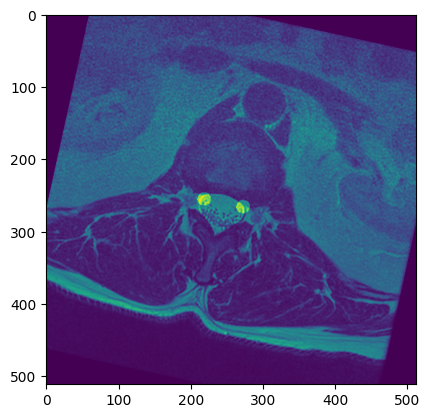

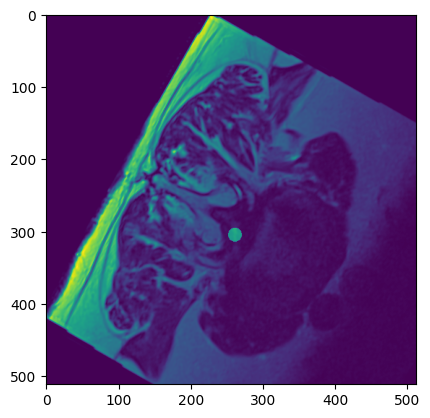

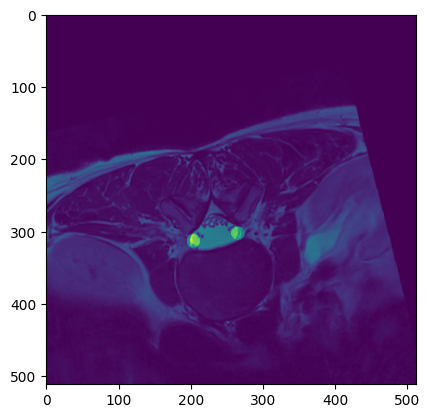

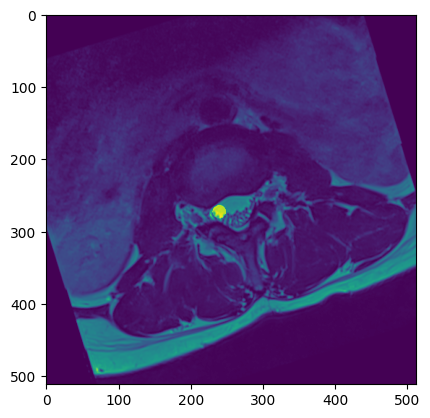

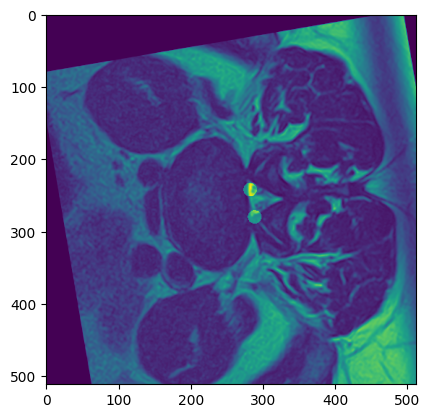

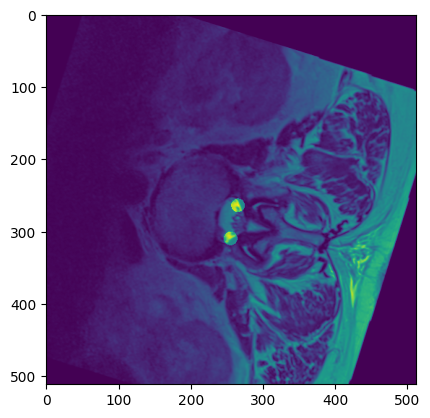

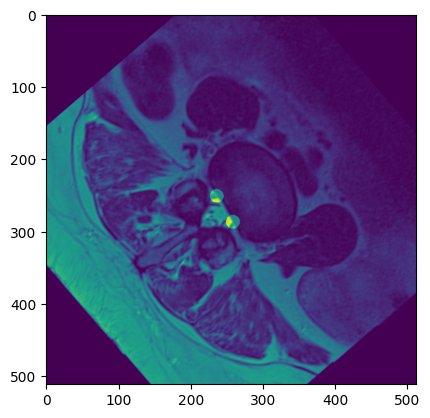

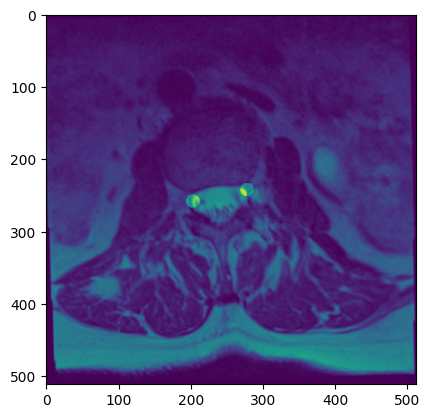

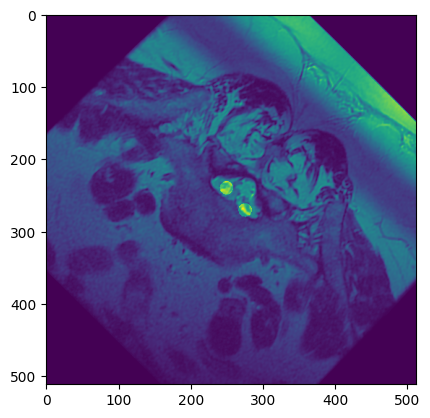

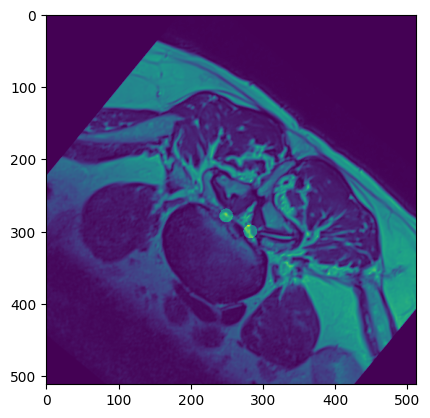

In [26]:
for k in range(10):
    image,centers = tds.__getitem__(np.random.randint(len(tds)))
    centers = centers[centers.isnan().sum(1) == 0]
#   Ideal heatmaps
    mask = idx_map - centers.view(len(centers),2,1,1).to(device)
    mask = (mask*mask).sum(1)
    mask = torch.exp(A*mask)
    mask = mask.sum(0)
    plt.imshow(image.cpu()[0] + .5*(mask.cpu() > TH))
    plt.show()

In [27]:
vds = Axial_T2_axial_side_Dataset(S,VALID=True)

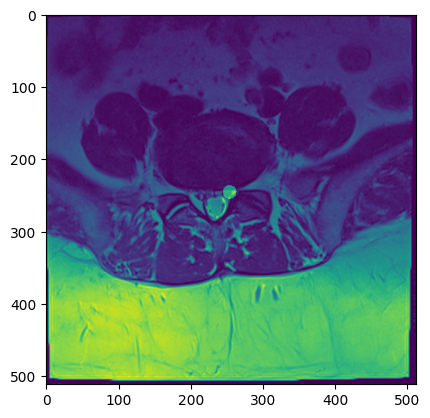

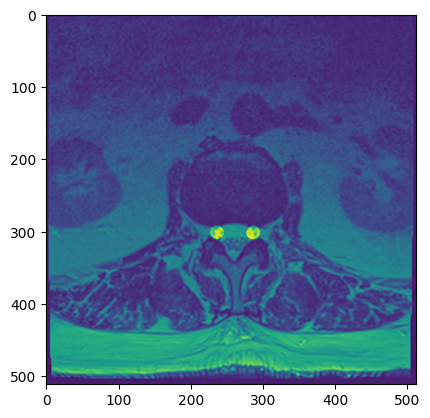

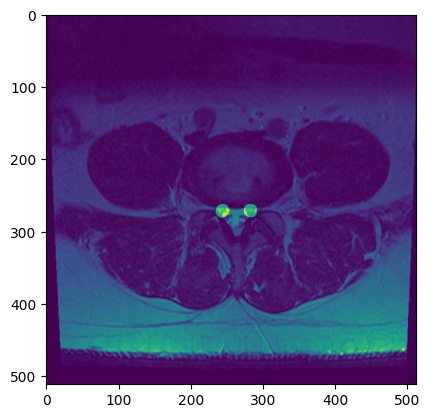

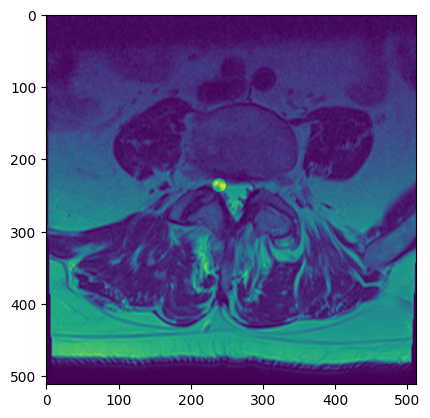

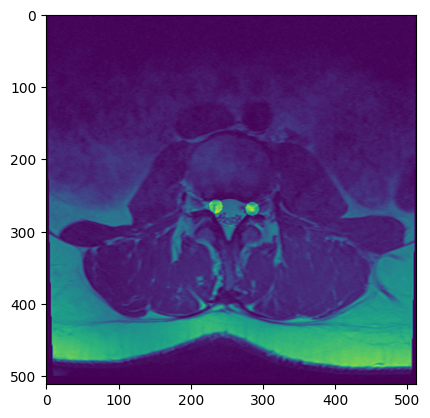

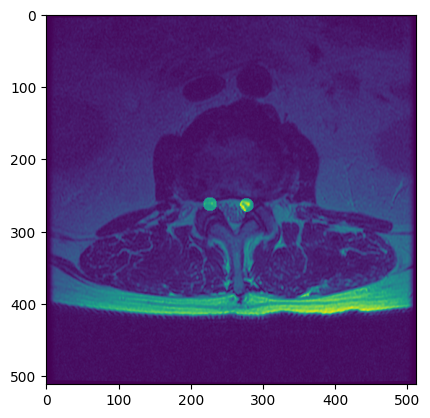

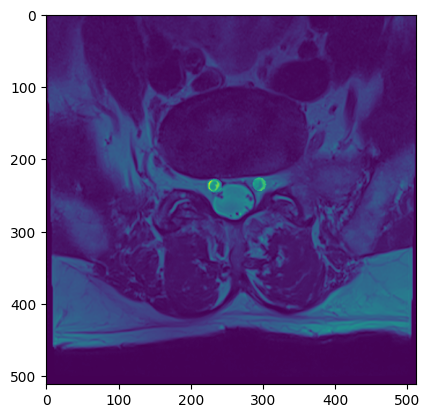

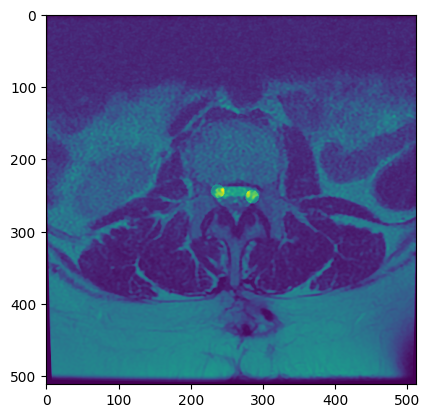

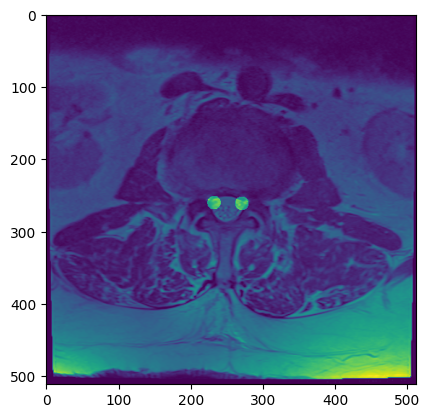

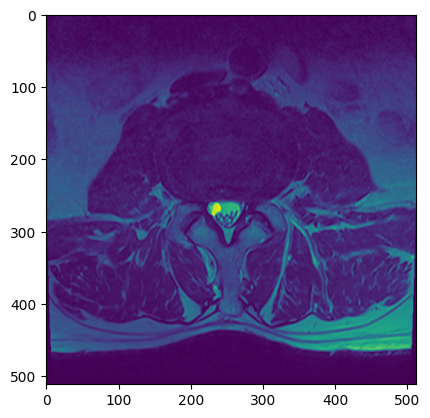

In [28]:
for k in range(10):
    image,centers = vds.__getitem__(np.random.randint(len(vds)))
    centers = centers[centers.isnan().sum(1) == 0]
#   Ideal heatmaps
    mask = idx_map - centers.view(len(centers),2,1,1).to(device)
    mask = (mask*mask).sum(1)
    mask = torch.exp(A*mask)
    mask = mask.sum(0)
    plt.imshow(image.cpu()[0] + .5*(mask.cpu() > TH))
    plt.show()

In [29]:
del tds,vds
gc.collect()

35421

In [30]:
def seed_everything(seed):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

In [31]:
class myUNet(nn.Module):
    def __init__(
        self,
        classes
        ):
        super(myUNet, self).__init__()

        self.classes = classes
        self.UNet = smp.Unet(
            encoder_name=ENCODER_NAME,
            classes=classes,
            in_channels=1
        ).to(device)

    def forward(self,X):
        H,W = X.shape[-2:]
        x = self.UNet(X.view(-1,1,H,W)).view(-1,H*W)
#       MinMaxScaling along the class plane to generate a heatmap
        min_values = x.min(-1)[0].view(-1,1)
        max_values = x.max(-1)[0].view(-1,1)
        d = (max_values - min_values)
        d[d == 0] = 1
        x = (x - min_values)/d
        
        return x.view(-1,self.classes,H,W)

In [32]:
class myLoss(nn.Module):
    def __init__(
            self,
            alpha=.5,
            smooth = 1e-6
        ):
        super().__init__()
        self.alpha = alpha
        self.smooth = smooth

    def clone(self):
        return myLoss(self.alpha)

    def forward(
            self,
            heatmaps,# Predictions
            centers # Targets
        ):
        H,W = heatmaps.shape[-2:]
        heatmaps = heatmaps.view(-1,H*W)
        centers = centers.view(-1,2)
        m = centers.isnan().sum(1) == 0
        heatmaps = heatmaps[m]
        centers = centers[m]
#       Ideal heatmaps
        mask = idx_map - centers.view(len(centers),2,1,1).to(device)
        mask = (mask*mask).sum(1)
        mask = torch.exp(A*mask)
        mask = mask.view(-1,H*W)
#       Distance
        D = 1 - ((mask*heatmaps).sum(-1))**2/((mask*mask).sum(-1)*(heatmaps*heatmaps).sum(-1)+self.smooth)
        
        return D.mean()

In [33]:
# CosineAnnealingAlpha
def nt(nmin,nmax,tcur,tmax):
    return (nmax - .5*(nmax-nmin)*(1+np.cos(tcur*np.pi/tmax))).astype(np.float32)

#plt.plot(nt(.25,1,np.arange(EPOCHS),EPOCHS))
#plt.show()

# callback to update alpha during training
def cb(self):
    alpha = torch.as_tensor(nt(.25,1,learn.train_iter,EPOCHS*n_iter))
    learn.dls.train_ds.alpha = alpha
alpha_cb = Callback(before_batch=cb)

epoch,train_loss,valid_loss,time
0,0.156458,0.155827,31:49


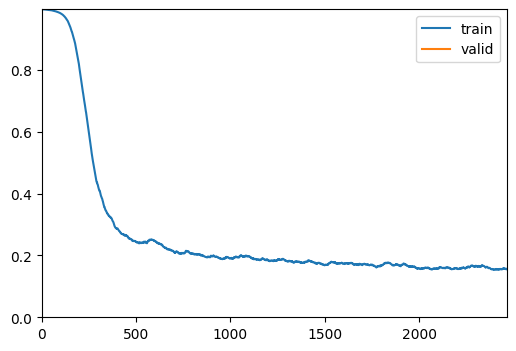

epoch,train_loss,valid_loss,time
0,0.161112,0.160898,29:37


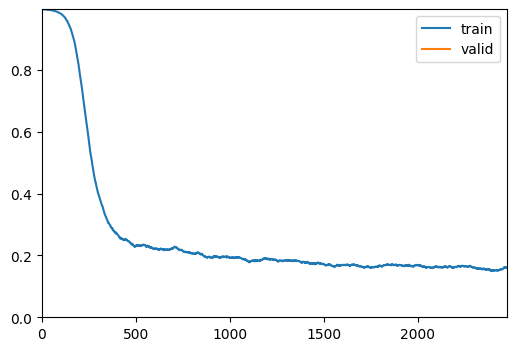

epoch,train_loss,valid_loss,time
0,0.158322,0.154147,29:37


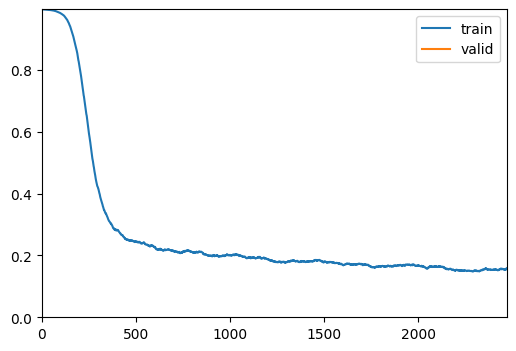

epoch,train_loss,valid_loss,time
0,0.153739,0.164780,29:42


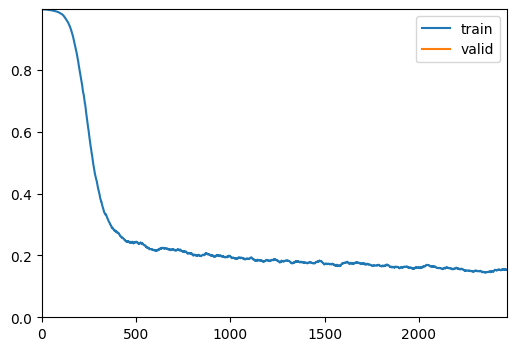

epoch,train_loss,valid_loss,time
0,0.152345,0.161557,29:41


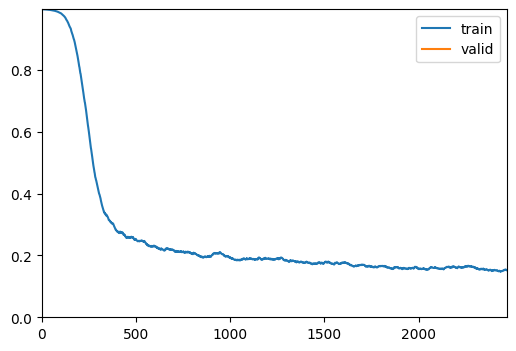

In [34]:
for f in FOLDS:
    seed_everything(SEED)
    model = myUNet(2)
    
    tdf = S[S['fold'] != f]
    vdf = S[S['fold'] == f]

    tds = Axial_T2_axial_side_Dataset(tdf)
    vds = Axial_T2_axial_side_Dataset(vdf,VALID=True)
    
    tdl = torch.utils.data.DataLoader(tds, batch_size=BS, shuffle=True, drop_last=True)
    vdl = torch.utils.data.DataLoader(vds, batch_size=BS, shuffle=False)

    dls = DataLoaders(tdl,vdl)

    n_iter = len(tds)//BS

    learn = Learner(
        dls,
        model,
        lr=LR,
        loss_func=myLoss(alpha=0.5),
        cbs=[
            ShowGraphCallback(),
            alpha_cb
        ]
    )
    learn.fit_one_cycle(EPOCHS)
    torch.save(model,'Axial_T2_axial_side_segmentation_'+str(f))
    del tdl,vdl,dls,model,learn
    gc.collect()

In [35]:
f = 1
model = torch.load('Axial_T2_axial_side_segmentation_'+str(f))
vdf = S[S['fold'] == f]
vds = Axial_T2_axial_side_Dataset(vdf,VALID=True)

6719


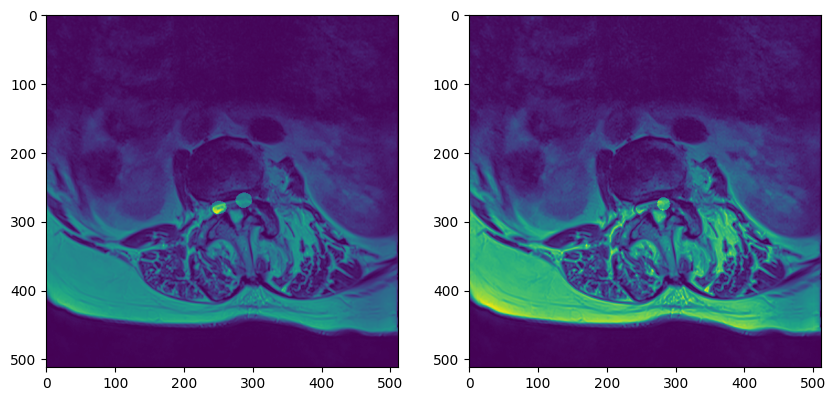

4790


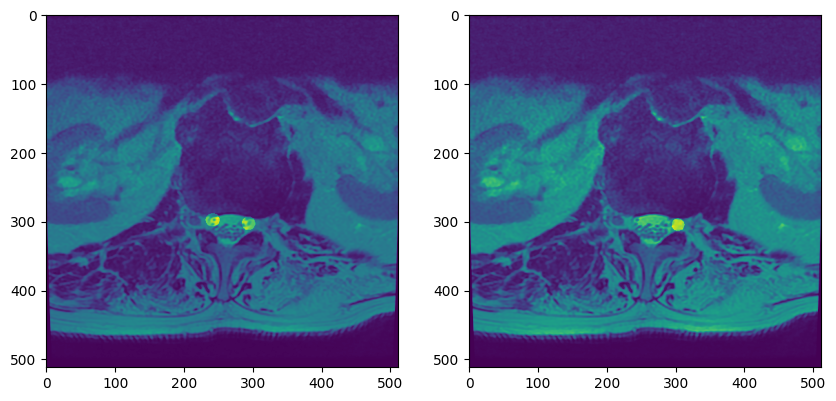

7472


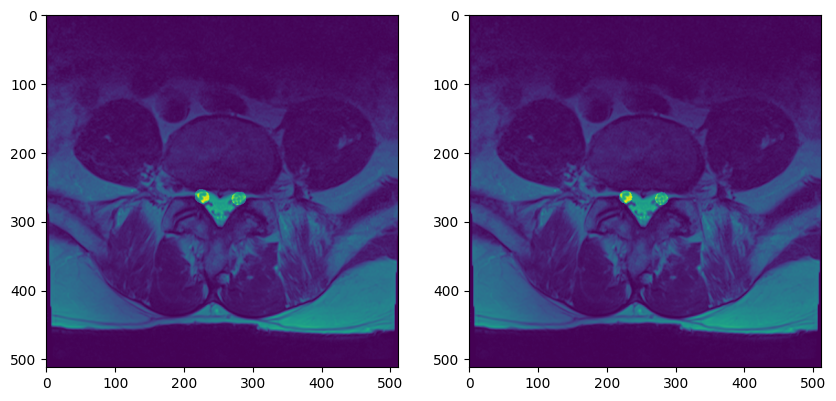

4683


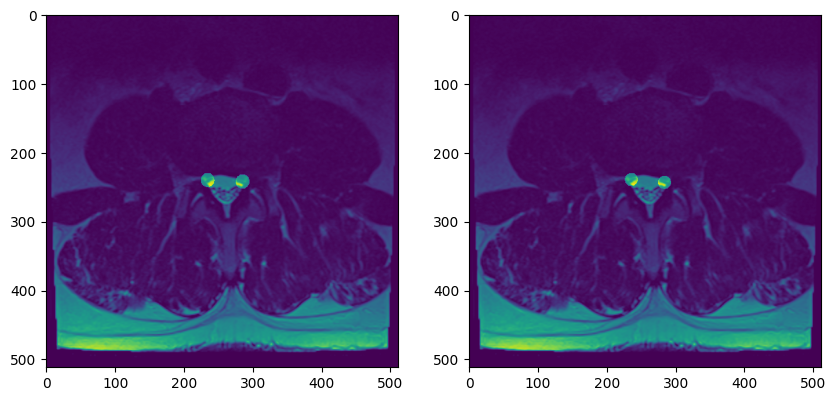

8680


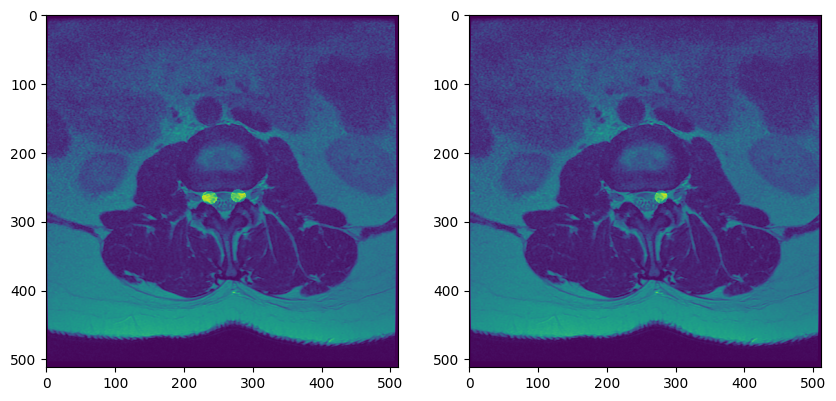

4946


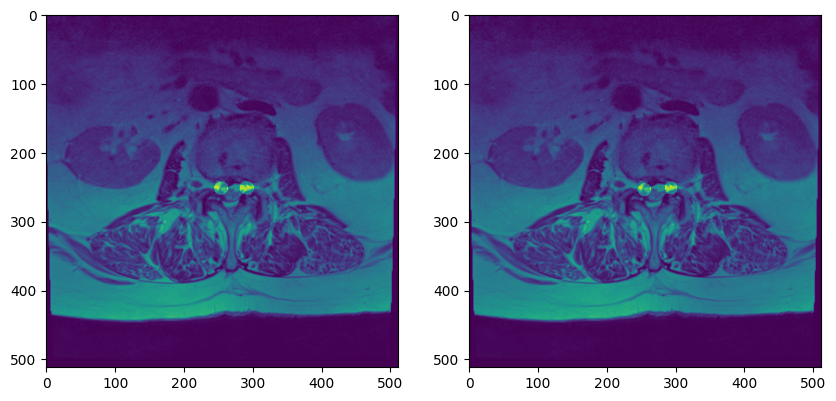

5654


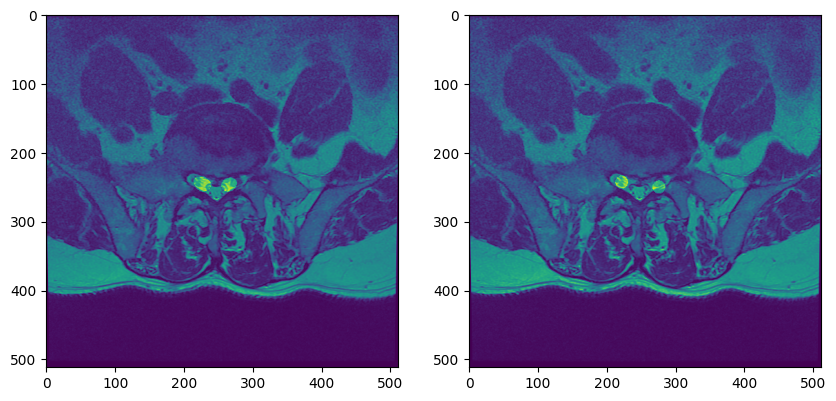

6433


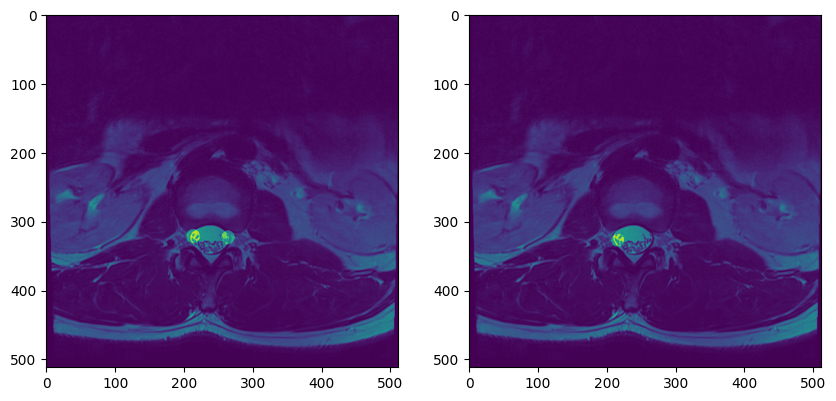

7295


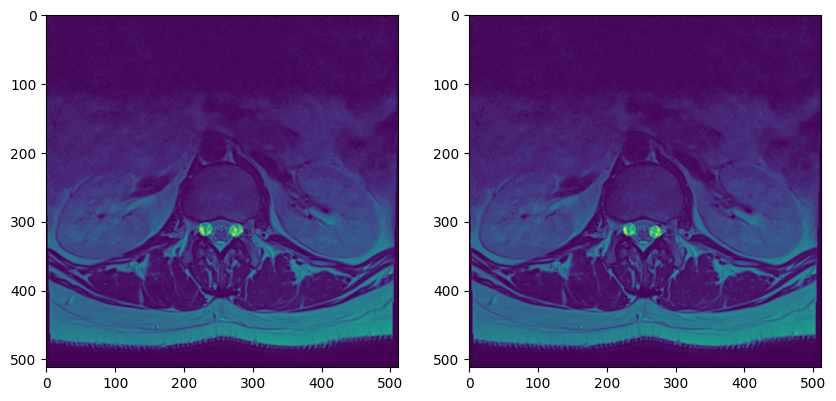

8909


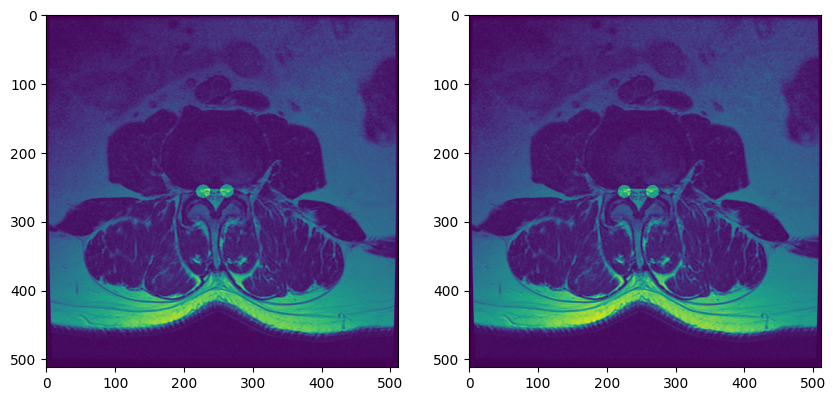

7481


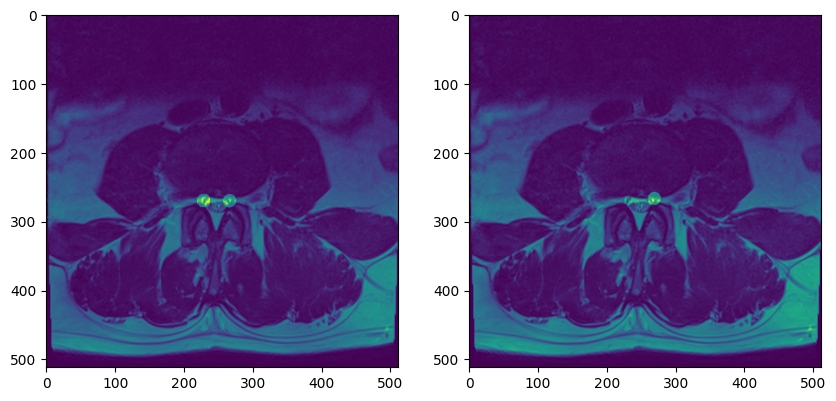

3296


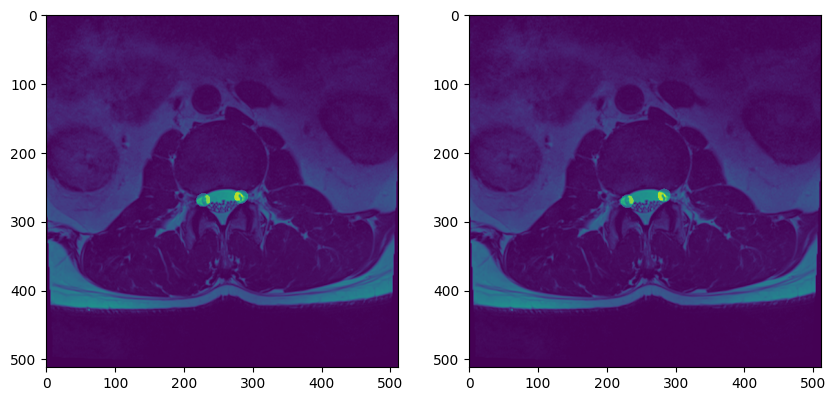

5322


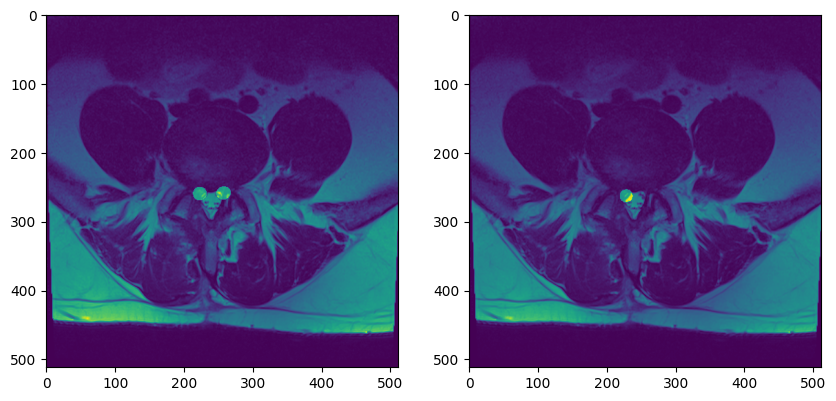

9274


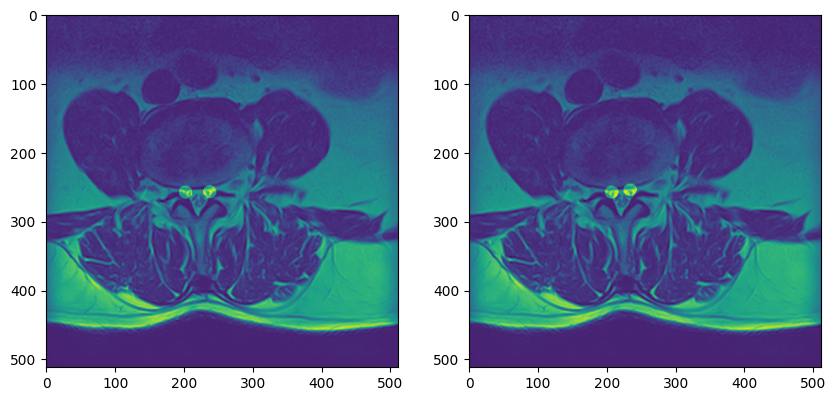

6294


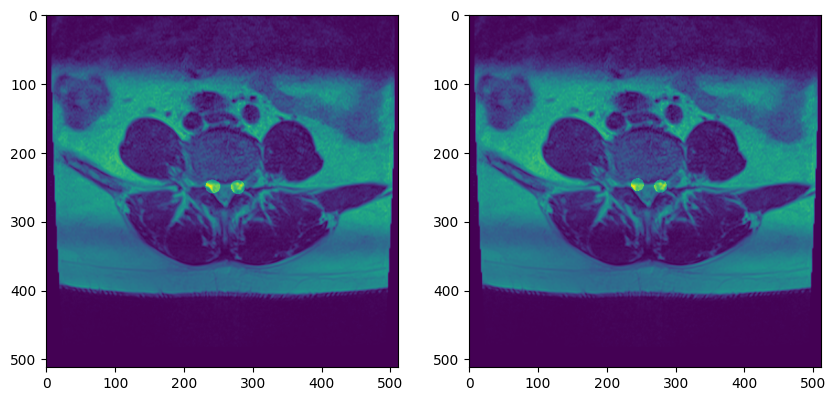

456


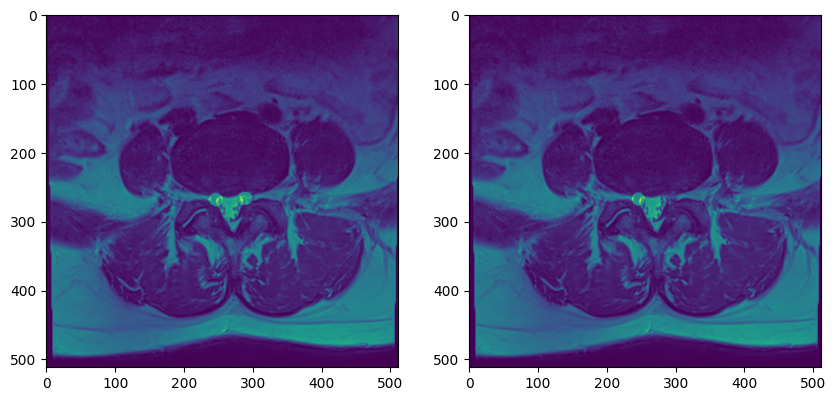

8604


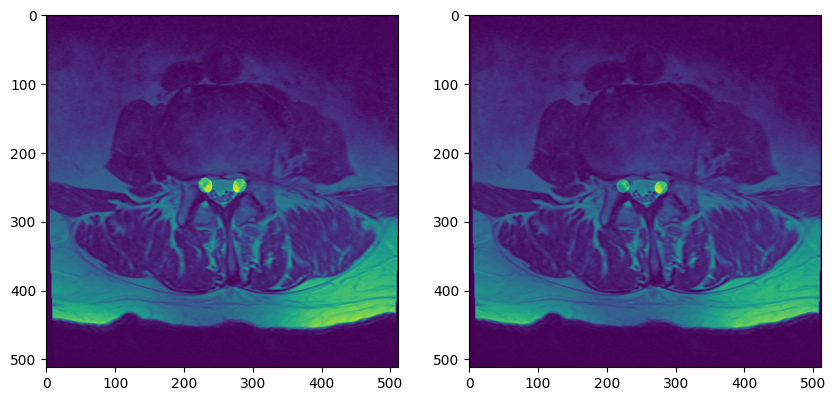

8091


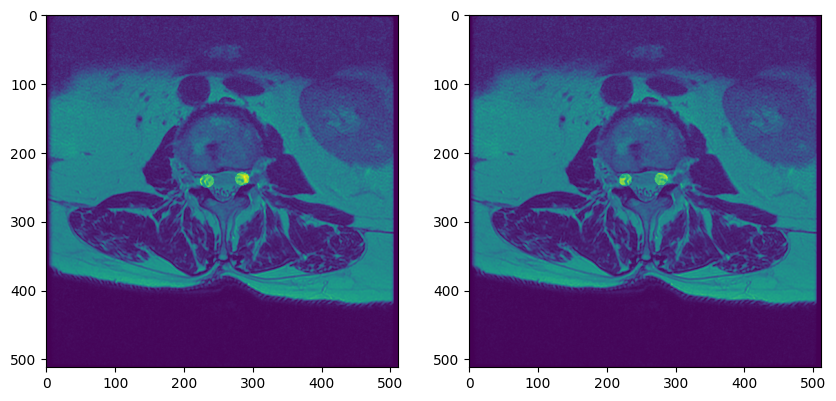

4490


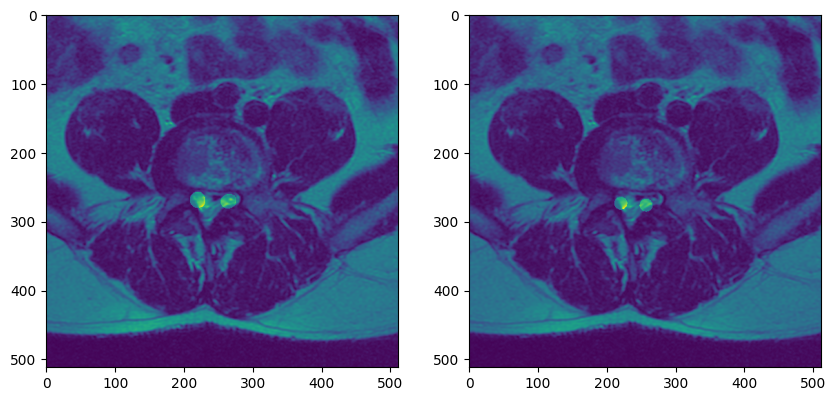

7251


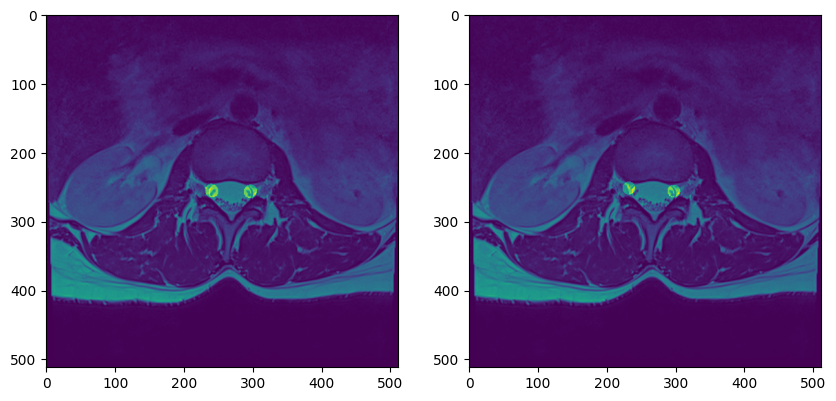

In [36]:
for k in range(20):
    i = np.random.randint(len(vds))
    print(i)
    image,centers = vds.__getitem__(np.random.randint(len(vds)))
    centers = centers[centers.isnan().sum(1) == 0]
#   Ideal heatmaps
    mask = idx_map - centers.view(len(centers),2,1,1).to(device)
    mask = (mask*mask).sum(1)
    mask = torch.exp(A*mask)
    mask = mask.sum(0)
    fig, axes = plt.subplots(1, 2, figsize=(10,10))
    axes[0].imshow(image.cpu()[0] + .5*(model(image.unsqueeze(0))[0].detach().cpu() > TH).sum(0))
    axes[1].imshow(image.cpu()[0] + .5*(mask.cpu() > TH))
    plt.show()

In [37]:
del model,vdf,vds
gc.collect()

28845